# Computational Social Science Project #3 

**Enter your Name: *Alejandro Rodriguez*

*Semester:* Fall 2025

## 1. Introduction

### Load data 

In [4]:
#
# load libraries
# -----------
import pandas as pd
import numpy as np
pd.set_option('display.max_columns', None)
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split, cross_validate, cross_val_score
from sklearn.linear_model import LogisticRegression

# There are a few warnings that will appear that will not affect your analysis. Run this code to ignore. 
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

# Make sure to import other libraries that will be necessary for training models!

In [5]:
#
# read in "Inspections Data 2011-2013" csv data
# -----------
chicago_inspections_2011_to_2013 = pd.read_csv("Chicago Inspections 2011-2013.csv", 
                                              low_memory=False)

#
# read in  "Inspections Data 2014_updated" csv data
# -----------
chicago_inspections_2014 = pd.read_csv("Chicago Inspections 2014_updated.csv",  # be sure to use the "updated" data here
                                      low_memory=False)

In [49]:
chicago_inspections_2011_to_2013Original = pd.read_csv("Chicago Inspections 2011-2013.csv", 
                                              low_memory=False)
chicago_inspections_2011_to_2013Original.columns


Index(['Inspection_ID', 'Inspection_Date', 'DBA_Name', 'AKA_Name', 'License',
       'Facility_Type', 'Risk', 'Address', 'City', 'State', 'Zip',
       'Inspection_Type', 'Results', 'Latitude', 'Longitude', 'Location',
       'Facility_Type_Clean', 'criticalCount', 'seriousCount', 'minorCount',
       'pass_flag', 'fail_flag', 'pastFail', 'pastCritical', 'pastSerious',
       'pastMinor', 'timeSinceLast', 'firstRecord', 'ID', 'LICENSE_ID',
       'ACCOUNT_NUMBER', 'LEGAL_NAME', 'DOING_BUSINESS_AS_NAME', 'ADDRESS',
       'CITY', 'STATE', 'ZIP_CODE', 'WARD', 'PRECINCT', 'WARD_PRECINCT',
       'POLICE_DISTRICT', 'LICENSE_CODE', 'LICENSE_DESCRIPTION',
       'BUSINESS_ACTIVITY_ID', 'BUSINESS_ACTIVITY', 'LICENSE_NUMBER',
       'APPLICATION_TYPE', 'LICENSE_TERM_START_DATE',
       'LICENSE_TERM_EXPIRATION_DATE', 'LICENSE_STATUS', 'LATITUDE',
       'LONGITUDE', 'minDate', 'maxDate', 'ageAtInspection',
       'consumption_on_premises_incidental_activity', 'tobacco',
       'package_goods',

In [6]:
# look at the inspections data
chicago_inspections_2011_to_2013.head()

,Inspection_ID,Inspection_Date,DBA_Name,AKA_Name,License,Facility_Type,Risk,Address,City,State,Zip,Inspection_Type,Results,Latitude,Longitude,Location,Facility_Type_Clean,criticalCount,seriousCount,minorCount,pass_flag,fail_flag,pastFail,pastCritical,pastSerious,pastMinor,timeSinceLast,firstRecord,ID,LICENSE_ID,ACCOUNT_NUMBER,LEGAL_NAME,DOING_BUSINESS_AS_NAME,ADDRESS,CITY,STATE,ZIP_CODE,WARD,PRECINCT,WARD_PRECINCT,POLICE_DISTRICT,LICENSE_CODE,LICENSE_DESCRIPTION,BUSINESS_ACTIVITY_ID,BUSINESS_ACTIVITY,LICENSE_NUMBER,APPLICATION_TYPE,LICENSE_TERM_START_DATE,LICENSE_TERM_EXPIRATION_DATE,LICENSE_STATUS,LATITUDE,LONGITUDE,minDate,maxDate,ageAtInspection,consumption_on_premises_incidental_activity,tobacco,package_goods,outdoor_patio,public_place_of_amusement,limited_business_license,childrens_services_facility_license,tavern,regulated_business_license,filling_station,caterers_liquor_license,mobile_food_license,precipIntensity,temperatureMax,windSpeed,humidity,heat_burglary,heat_garbage,heat_sanitation,criticalFound
0,269961,2013-01-31,SEVEN STAR,SEVEN STAR,30790,Grocery Store,Risk 3 (Low),3352 N BROADWAY,CHICAGO,IL,60657.0,Canvass,Pass,41.943359,-87.644999,"(41.943359344775146, -87.64499875300952)",Other,0,0,2,1,0,0,0,0,0,2.0,1,30790-20110416,2081412.0,63759.0,VIRGINIA DELA ROSA,SEVEN STAR,3352 N BROADWAY 1,CHICAGO,IL,60657.0,44.0,33.0,44-33,19.0,1006.0,Retail Food Establishment,775,Retail Sales of Perishable Foods,30790.0,RENEW,2011-04-16,2013-04-15,AAI,41.943359,-87.644999,2002-02-16,2015-04-15,10.964384,0,1,0,0,0,1,0,0,0,0,0,0,0.014587,53.496667,13.340000,0.900000,26.992376,12.768572,37.748787,0
1,507211,2011-10-18,PANERA BREAD,PANERA BREAD,1475890,Restaurant,Risk 1 (High),6059 N LINCOLN AVE,CHICAGO,IL,60659.0,Canvass,Pass,41.991919,-87.709631,"(41.99191947239194, -87.70963133440333)",Restaurant,0,0,3,1,0,0,0,0,0,2.0,1,1475890-20110416,2081695.0,207283.0,"PANERA, LLC",PANERA BREAD,6059 N LINCOLN AVE C,CHICAGO,IL,60659.0,50.0,23.0,50-23,24.0,1006.0,Retail Food Establishment,775,Retail Sales of Perishable Foods,1475890.0,RENEW,2011-04-16,2013-04-15,AAI,41.991919,-87.709631,2004-05-05,2019-04-15,7.457534,0,0,0,0,0,0,0,0,0,0,0,0,0.001907,59.046667,13.016667,0.550000,13.976557,12.895485,15.412267,0
2,507212,2011-10-18,LITTLE QUIAPO RESTAURANT,LITTLE QUIAPO RESTAURANT,1740130,Restaurant,Risk 1 (High),6259 N MCCORMICK RD,CHICAGO,IL,60659.0,Canvass,Fail,41.995632,-87.712707,"(41.99563177556418, -87.71270678169132)",Restaurant,0,2,6,0,1,0,0,0,0,2.0,1,1740130-20110216,2070145.0,3107.0,ENELITA GARCIA,LITTLE QUIAPO RESTAURANT,6259 N MCCORMICK RD,CHICAGO,IL,60659.0,50.0,25.0,50-25,17.0,1006.0,Retail Food Establishment,775,Retail Sales of Perishable Foods,1740130.0,RENEW,2011-02-16,2013-02-15,AAI,41.995632,-87.712707,2007-03-22,2017-02-15,4.578082,0,0,0,0,0,0,0,0,0,0,0,0,0.001907,59.046667,13.016667,0.550000,12.611239,8.004220,8.320330,0
3,507216,2011-10-19,SERGIO'S TAQUERIA PIZZA INC.,SERGIO'S TAQUERIA PIZZA,1447363,Restaurant,Risk 1 (High),3253 W BRYN MAWR AVE,CHICAGO,IL,60659.0,Canvass,Pass,41.982933,-87.710982,"(41.982933189164974, -87.71098225381141)",Restaurant,0,0,6,1,0,0,0,0,0,2.0,1,1447363-20110216,2071895.0,270993.0,SERGIO'S TAZUERIA PIZZA INC.,SERGIO'S TAQUERIA PIZZA INC.,3253 W BRYN MAWR AVE,CHICAGO,IL,60659.0,39.0,48.0,39-48,17.0,1006.0,Retail Food Establishment,775,Retail Sales of Perishable Foods,1447363.0,RENEW,2011-02-16,2013-02-15,AAI,41.982933,-87.710982,2003-12-31,2019-02-15,7.805479,0,0,0,0,0,0,0,0,0,0,0,0,0.002737,56.153333,10.863333,0.616667,35.906383,26.238645,38.186618,0
4,507219,2011-10-20,TARGET STORE # T-2079,TARGET,1679459,Restaurant,Risk 2 (Medium),2112 W PETERSON AVE,CHICAGO,IL,60659.0,Canvass,Fail,41.990729,-87.682979,"(41.99072921796059, -87.68297945359863)",Restaurant,0,2,6,0,1,0,0,0,0,2.0,1,1679459-20100216,2009972.0,15538.0,TARGET CORPORATION,TARGET STORE # T-2079,2112 W PETERSON AVE,CHICAGO,IL,60659.0,40.0,18.0,40-18,24.0,1006.0,Retail Food Establishment,775,Retail Sales of Perishable Foods,1679459.0,RENEW,

In [7]:
# list column names
chicago_inspections_2011_to_2013.columns

Index(['Inspection_ID', 'Inspection_Date', 'DBA_Name', 'AKA_Name', 'License',
       'Facility_Type', 'Risk', 'Address', 'City', 'State', 'Zip',
       'Inspection_Type', 'Results', 'Latitude', 'Longitude', 'Location',
       'Facility_Type_Clean', 'criticalCount', 'seriousCount', 'minorCount',
       'pass_flag', 'fail_flag', 'pastFail', 'pastCritical', 'pastSerious',
       'pastMinor', 'timeSinceLast', 'firstRecord', 'ID', 'LICENSE_ID',
       'ACCOUNT_NUMBER', 'LEGAL_NAME', 'DOING_BUSINESS_AS_NAME', 'ADDRESS',
       'CITY', 'STATE', 'ZIP_CODE', 'WARD', 'PRECINCT', 'WARD_PRECINCT',
       'POLICE_DISTRICT', 'LICENSE_CODE', 'LICENSE_DESCRIPTION',
       'BUSINESS_ACTIVITY_ID', 'BUSINESS_ACTIVITY', 'LICENSE_NUMBER',
       'APPLICATION_TYPE', 'LICENSE_TERM_START_DATE',
       'LICENSE_TERM_EXPIRATION_DATE', 'LICENSE_STATUS', 'LATITUDE',
       'LONGITUDE', 'minDate', 'maxDate', 'ageAtInspection',
       'consumption_on_premises_incidental_activity', 'tobacco',
       'package_goods',

In [8]:
chicago_inspections_2011_to_2013.shape

(17677, 75)

In [9]:
# drop column names related to geography, identification, and pass/fail flags that perfectly predict the outcome
chicago_inspections_2011_to_2013.drop(columns = ['AKA_Name', 
                                                 'License',
                                                 'Address',
                                                 'City',
                                                 'State',
                                                 'Zip',
                                                 'Latitude',
                                                 'Longitude',
                                                 'Location',
                                                 'LICENSE_ID',
                                                 'LICENSE_TERM_START_DATE',
                                                 'LICENSE_TERM_EXPIRATION_DATE',
                                                 'LICENSE_STATUS',
                                                 'ACCOUNT_NUMBER',
                                                 'LEGAL_NAME',
                                                 'DOING_BUSINESS_AS_NAME',
                                                 'ADDRESS',
                                                 'CITY',
                                                 'STATE',
                                                 'ZIP_CODE',
                                                 'WARD',
                                                 'PRECINCT',
                                                 'LICENSE_CODE',
                                                 'BUSINESS_ACTIVITY_ID',
                                                 'BUSINESS_ACTIVITY',
                                                 'LICENSE_NUMBER',
                                                 'LATITUDE',
                                                 'LONGITUDE',
                                                 'pass_flag',
                                                 'fail_flag'],
                                     inplace = True)

# set index
chicago_inspections_2011_to_2013.set_index(['Inspection_ID', 'DBA_Name'], inplace = True)

In [10]:
# convert the inspection date to a datetime format
chicago_inspections_2011_to_2013['Inspection_Date'] = pd.to_datetime(chicago_inspections_2011_to_2013['Inspection_Date'])  

### Visualization

Let's visualize what inspections look like over time.

<Axes: title={'center': 'Inspections by Month and Year'}, xlabel='Inspection_MonthYear'>

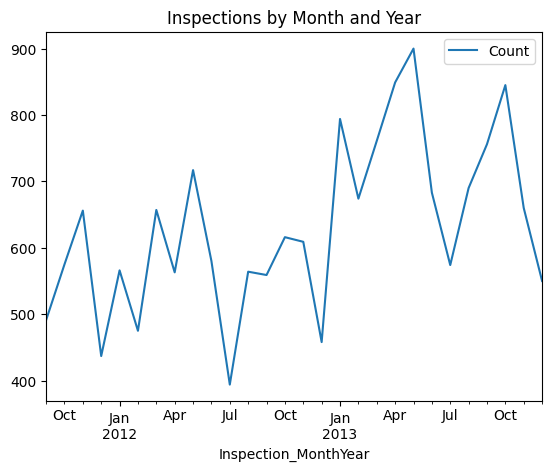

In [11]:
# visualize inspections over time
# -----------
chicago_inspections_2011_to_2013['Inspection_MonthYear'] = chicago_inspections_2011_to_2013['Inspection_Date'].dt.to_period('M')
counts_by_day = chicago_inspections_2011_to_2013.groupby('Inspection_MonthYear').count().rename(columns = {'Facility_Type': 'Count'})['Count'].reset_index()
counts_by_day.set_index(["Inspection_MonthYear"], inplace = True)
counts_by_day.plot(title = "Inspections by Month and Year") 

Let's visualize what the distribution of results looks like.

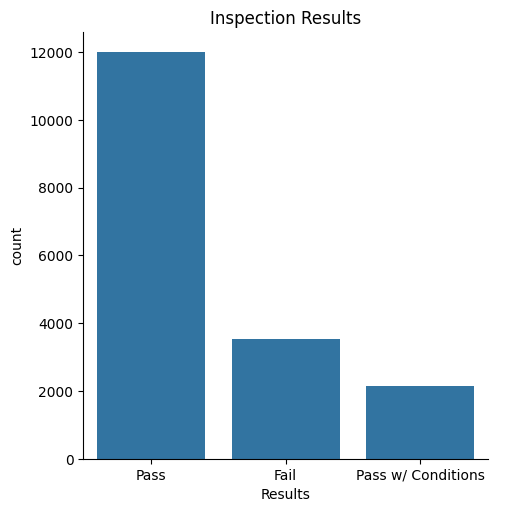

In [12]:
# view inspection results
# -----------
sns.catplot(data = chicago_inspections_2011_to_2013,
           x = "Results",
           kind = "count")

plt.title("Inspection Results")
plt.show()

What if we separate results by facility type?

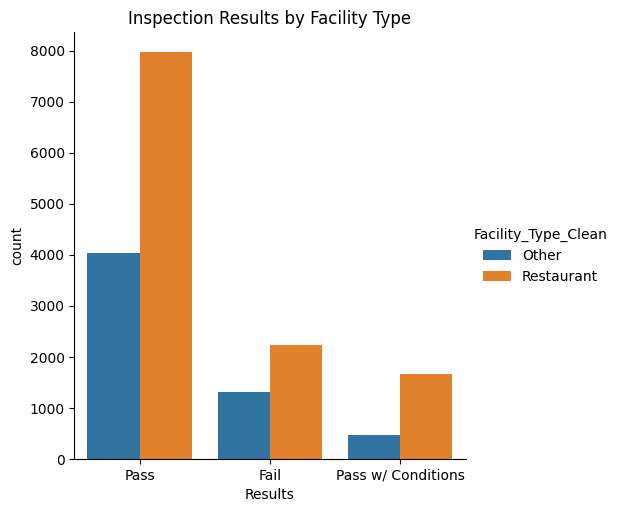

In [13]:
# view inspection results by facility type (restaurant or not)
# -----------
sns.catplot(data = chicago_inspections_2011_to_2013,
            x = "Results",
            kind = "count",
            hue = 'Facility_Type_Clean')

plt.title("Inspection Results by Facility Type")
plt.show();

In [14]:
chicago_inspections_2011_to_2013.head()
#chicago_inspections_2011_to_2013.shape

print(chicago_inspections_2011_to_2013["seriousCount"].unique())

[0 2 1 3 4 5]


## 2. Data Preprocessing and Cleaning

In [15]:
# drop datetime info
# -----------
chicago_inspections_2011_to_2013 = chicago_inspections_2011_to_2013.dropna().drop(['Inspection_Date',
                                                                                   'minDate',
                                                                                   'maxDate',
                                                                                   'Inspection_MonthYear'],
                                                                                  axis = 1)

In [16]:
# process target 
# -----------
y = chicago_inspections_2011_to_2013['Results']

# decide if you want to binarize the outcome variable 
# Yes, i want to binarize only to Pass and Fail
y = y.replace({'Pass w/ Conditions': 'Pass'})
lb_style = LabelBinarizer()
y = lb_style.fit_transform(y)

# recode 0s and 1s so 1s are "Fail"
y = np.where(y == 1, 0 ,1)


# process features
X = pd.get_dummies(chicago_inspections_2011_to_2013)      # get_dummies creates dummy vars for each category

# create feature dataset
X = chicago_inspections_2011_to_2013.drop(columns = ['Results', 
                                                     'Facility_Type', 
                                                     'LICENSE_DESCRIPTION', 
                                                     'WARD_PRECINCT'])


# get dummies
X = pd.get_dummies(X)

In [17]:
# view feature datset
X.head()
#X.columns

,,criticalCount,seriousCount,minorCount,pastFail,pastCritical,pastSerious,pastMinor,timeSinceLast,firstRecord,POLICE_DISTRICT,ageAtInspection,consumption_on_premises_incidental_activity,tobacco,package_goods,outdoor_patio,public_place_of_amusement,limited_business_license,childrens_services_facility_license,tavern,regulated_business_license,filling_station,caterers_liquor_license,mobile_food_license,precipIntensity,temperatureMax,windSpeed,humidity,heat_burglary,heat_garbage,heat_sanitation,criticalFound,Risk_Risk 1 (High),Risk_Risk 2 (Medium),Risk_Risk 3 (Low),Inspection_Type_Canvass,Facility_Type_Clean_Other,Facility_Type_Clean_Restaurant,ID_1000049-20100516,ID_1000049-20120516,ID_1000245-20110416,ID_1000325-20110216,ID_1000572-20120316,ID_1000612-20120216,ID_1000774-20121216,ID_1000894-20101016,ID_1000894-20121016,ID_1000978-20121016,ID_1001133-20130216,ID_10139-20110916,ID_10166-20110316,ID_10166-20130316,ID_10169-20110916,ID_10175-20111016,ID_1021659-20110716,ID_1021782-20110416,ID_1021782-20130416,ID_1021790-20110316,ID_1021790-20130316,ID_10228-20110916,ID_10229-20100816,ID_10235-20110716,ID_10240-20120516,ID_10306-20100816,ID_10306-20120816,ID_10393-20110616,ID_10399-20120116,ID_10400-20111016,ID_1042276-20110216,ID_1042285-20111116,ID_1042390-20100516,ID_1042390-20120516,ID_1042399-20120216,ID_1042702-20110416,ID_1042702-20130416,ID_1042792-20120116,ID_1042895-20100116,ID_1042895-20120116,ID_1042910-20120116,ID_1042933-20110716,ID_1043-20120516,ID_1043008-20130316,ID_1043118-20110316,ID_1043118-20130316,ID_1043148-20110416,ID_1043148-20130416,ID_1043368-20110416,ID_1043368-20130416,ID_1043422-20110616,ID_1043471-20101016,ID_1043532-20101016,ID_1043583-20110316,ID_1043583-20130316,ID_1043591-20111016,ID_1043826-20110316,ID_1043848-20121016,ID_1043966-20110716,ID_1044031-20110416,ID_1044092-20100816,ID_1044092-20120816,ID_1044156-20110916,ID_1044305-20100616,ID_1044305-20120616,ID_1044370-20120716,ID_1044375-20110916,ID_1044375-20130916,ID_1044650-20130116,ID_1044682-20120616,ID_1044712-20110516,ID_1044714-20110516,ID_1044724-20130516,ID_1044743-20120616,ID_1044746-20130416,ID_1044752-20110116,ID_1044752-20130116,ID_1044796-20120616,ID_1044839-20111116,ID_1044860-20100816,ID_1044860-20120816,ID_1044933-20110816,ID_1044933-20130816,ID_1044967-20110316,ID_1044967-20130316,ID_1044988-20120816,ID_1045099-20111116,ID_1045268-20100816,ID_1045268-20120816,ID_1045301-20120516,ID_1045342-20110116,ID_1045342-20130116,ID_1045365-20110616,ID_1045381-20120716,ID_1045384-20120716,ID_1045391-20100616,ID_1045391-20120616,ID_1045468-20120116,ID_1045545-20110716,ID_1045545-20130716,ID_1045614-20091116,ID_1045614-20111116,ID_1045634-20110616,ID_1045770-20110316,ID_1045770-20130316,ID_1045922-20110716,ID_1046017-20130416,ID_1046040-20111116,ID_1046054-20110216,ID_1046054-20130216,ID_1046092-20120216,ID_1046473-20100116,ID_10468-20110416,ID_1047032-20111116,ID_1047059-20110316,ID_1047081-20100416,ID_1047081-20120416,ID_1047084-20130216,ID_1047098-20111016,ID_1047126-20121016,ID_1047168-20111016,ID_1047189-20111116,ID_1047362-20121216,ID_10476-20110716,ID_10477-20110916,ID_1047724-20120616,ID_1047845-20120116,ID_10486-20130416,ID_10488-20110716,ID_1050-20130216,ID_1052-20120916,ID_10540-20110716,ID_10559-20121116,ID_1058-20121116,ID_1060-20120116,ID_10611-20110716,ID_1064-20100816,ID_1064-20120816,ID_1068962-20120216,ID_1069050-20110716,ID_1069067-20110916,ID_1069143-20101216,ID_1069143-20121216,ID_1069158-20120416,ID_1069184-20121016,ID_1069215-20111216,ID_1069298-20100416,ID_1069298-20120416,ID_1069573-20120516,ID_1069683-20100916,ID_1069683-20120916,ID_1069760-20110216,ID_1069760-20130216,ID_1069776-20110316,ID_1069776-20130316,ID_1069788-20110716,ID_1069788-20130716,ID_1069789-20110716,ID_1069817-20130516,ID_1069820-20110516,ID_1069820-20130516,ID_1069884-20110816,ID_1070032-20101016,ID_1070038-20120116,ID_1070144-20101116,ID_1070157-20120616,ID_1070164-20120116,ID_1070189-20120616,ID_1070269-20110716,ID_10731-20101116,ID_10750-20121116,

## 3. Fit Models

Data splitting, no need of test because we will test in another dataset.

In [18]:
# Set seed
np.random.seed(10)

# training and validation split 
X_train, X_validate, y_train, y_validate = train_test_split(X, 
                                                            y, 
                                                            train_size = .75, 
                                                            test_size = .25, 
                                                            stratify = y) # Be sure to stratify the splits by the outcome so that we have as representative of a breakdown of outcome in our training/test/validations datasets as we can.

Now choose 3 different machine learning techniques and apply them below. Choose from one of the algorithms we have used in lab (e.g., logistic regression, random forests, `AdaBoost()`, `xgboost()`, `VotingClassifer()`, or `BART`). 

Detail the basic logic and assumptions underlying each model, its pros/cons, and why it is a plausible choice for this problem. Also, be sure to do the following:

1. Import the appropriate library from sklearn
2. Set up a hyperparameter grid (check out our previous labs to see how to do this)
3. Find the best hyperparameters, and then fit your model (using either train/validation splits or cross-validation)

The three models i will use are: Logistic regression, random forests,and BART

### Model 1: Logistic regression

In [19]:
## SCALE
# load library and create instance of Standard Scaler 
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

# identify non-dichotomous columns we want to transform
columns = list(X_train.select_dtypes(include=['number']).loc[:, X_train.nunique() > 2])

# use loop to transform training data for only columns we want to transform
for column in columns:
    X_train[column] = scaler.fit_transform(X_train[column].values.reshape(-1, 1)).flatten()

# use loop to transform validation data for only columns we want to transform
for column in columns:
    X_validate[column] = scaler.fit_transform(X_validate[column].values.reshape(-1, 1)).flatten()

In [20]:
X_validate.head()

,,criticalCount,seriousCount,minorCount,pastFail,pastCritical,pastSerious,pastMinor,timeSinceLast,firstRecord,POLICE_DISTRICT,ageAtInspection,consumption_on_premises_incidental_activity,tobacco,package_goods,outdoor_patio,public_place_of_amusement,limited_business_license,childrens_services_facility_license,tavern,regulated_business_license,filling_station,caterers_liquor_license,mobile_food_license,precipIntensity,temperatureMax,windSpeed,humidity,heat_burglary,heat_garbage,heat_sanitation,criticalFound,Risk_Risk 1 (High),Risk_Risk 2 (Medium),Risk_Risk 3 (Low),Inspection_Type_Canvass,Facility_Type_Clean_Other,Facility_Type_Clean_Restaurant,ID_1000049-20100516,ID_1000049-20120516,ID_1000245-20110416,ID_1000325-20110216,ID_1000572-20120316,ID_1000612-20120216,ID_1000774-20121216,ID_1000894-20101016,ID_1000894-20121016,ID_1000978-20121016,ID_1001133-20130216,ID_10139-20110916,ID_10166-20110316,ID_10166-20130316,ID_10169-20110916,ID_10175-20111016,ID_1021659-20110716,ID_1021782-20110416,ID_1021782-20130416,ID_1021790-20110316,ID_1021790-20130316,ID_10228-20110916,ID_10229-20100816,ID_10235-20110716,ID_10240-20120516,ID_10306-20100816,ID_10306-20120816,ID_10393-20110616,ID_10399-20120116,ID_10400-20111016,ID_1042276-20110216,ID_1042285-20111116,ID_1042390-20100516,ID_1042390-20120516,ID_1042399-20120216,ID_1042702-20110416,ID_1042702-20130416,ID_1042792-20120116,ID_1042895-20100116,ID_1042895-20120116,ID_1042910-20120116,ID_1042933-20110716,ID_1043-20120516,ID_1043008-20130316,ID_1043118-20110316,ID_1043118-20130316,ID_1043148-20110416,ID_1043148-20130416,ID_1043368-20110416,ID_1043368-20130416,ID_1043422-20110616,ID_1043471-20101016,ID_1043532-20101016,ID_1043583-20110316,ID_1043583-20130316,ID_1043591-20111016,ID_1043826-20110316,ID_1043848-20121016,ID_1043966-20110716,ID_1044031-20110416,ID_1044092-20100816,ID_1044092-20120816,ID_1044156-20110916,ID_1044305-20100616,ID_1044305-20120616,ID_1044370-20120716,ID_1044375-20110916,ID_1044375-20130916,ID_1044650-20130116,ID_1044682-20120616,ID_1044712-20110516,ID_1044714-20110516,ID_1044724-20130516,ID_1044743-20120616,ID_1044746-20130416,ID_1044752-20110116,ID_1044752-20130116,ID_1044796-20120616,ID_1044839-20111116,ID_1044860-20100816,ID_1044860-20120816,ID_1044933-20110816,ID_1044933-20130816,ID_1044967-20110316,ID_1044967-20130316,ID_1044988-20120816,ID_1045099-20111116,ID_1045268-20100816,ID_1045268-20120816,ID_1045301-20120516,ID_1045342-20110116,ID_1045342-20130116,ID_1045365-20110616,ID_1045381-20120716,ID_1045384-20120716,ID_1045391-20100616,ID_1045391-20120616,ID_1045468-20120116,ID_1045545-20110716,ID_1045545-20130716,ID_1045614-20091116,ID_1045614-20111116,ID_1045634-20110616,ID_1045770-20110316,ID_1045770-20130316,ID_1045922-20110716,ID_1046017-20130416,ID_1046040-20111116,ID_1046054-20110216,ID_1046054-20130216,ID_1046092-20120216,ID_1046473-20100116,ID_10468-20110416,ID_1047032-20111116,ID_1047059-20110316,ID_1047081-20100416,ID_1047081-20120416,ID_1047084-20130216,ID_1047098-20111016,ID_1047126-20121016,ID_1047168-20111016,ID_1047189-20111116,ID_1047362-20121216,ID_10476-20110716,ID_10477-20110916,ID_1047724-20120616,ID_1047845-20120116,ID_10486-20130416,ID_10488-20110716,ID_1050-20130216,ID_1052-20120916,ID_10540-20110716,ID_10559-20121116,ID_1058-20121116,ID_1060-20120116,ID_10611-20110716,ID_1064-20100816,ID_1064-20120816,ID_1068962-20120216,ID_1069050-20110716,ID_1069067-20110916,ID_1069143-20101216,ID_1069143-20121216,ID_1069158-20120416,ID_1069184-20121016,ID_1069215-20111216,ID_1069298-20100416,ID_1069298-20120416,ID_1069573-20120516,ID_1069683-20100916,ID_1069683-20120916,ID_1069760-20110216,ID_1069760-20130216,ID_1069776-20110316,ID_1069776-20130316,ID_1069788-20110716,ID_1069788-20130716,ID_1069789-20110716,ID_1069817-20130516,ID_1069820-20110516,ID_1069820-20130516,ID_1069884-20110816,ID_1070032-20101016,ID_1070038-20120116,ID_1070144-20101116,ID_1070157-20120616,ID_1070164-20120116,ID_1070189-20120616,ID_1070269-20110716,ID_10731-20101116,ID_10750-20121116,

In [21]:
# create a model
logit_reg = LogisticRegression()
# fit the model
logit_model = logit_reg.fit(X_train, y_train.ravel())
# predict on the validation data
y_pred = logit_model.predict(X_validate)

Set up of hyperparameter grid and find the best hyperparameters, and then fit your model. 

In [23]:

from sklearn.metrics import accuracy_score
from sklearn.model_selection import ParameterGrid

# how many random combinations to try
n_iter = 20  # or whatever you like

param_grid = {'penalty': ['l2'],
             'C': np.arange(.1, 1, .1),
             'fit_intercept': [True, False],
             'solver': ['liblinear', 'saga']}

# all possible combinations from your param_grid
all_params = list(ParameterGrid(param_grid))

# choose n_iter random indices (no replacement)
n_iter = min(n_iter, len(all_params))
rand_indices = np.random.choice(len(all_params), size=n_iter, replace=False)

best_score = -np.inf
best_params = None
best_logit_model = None

for idx in rand_indices:
    params = all_params[idx]

    # clone base model with these params
    model = logit_model.set_params(**params)
    model.fit(X_train, y_train)

    # *** training accuracy only ***
    train_pred = model.predict(X_train)
    train_acc = accuracy_score(y_train, train_pred)

    if train_acc > best_score:
        best_score = train_acc
        best_params = params
        best_logit_model = model

# evaluate best model on validation set
best_logit_pred = best_logit_model.predict(X_validate)
val_acc = accuracy_score(y_validate, best_logit_pred)

print("Best params (based on TRAIN accuracy):", best_params)
print("Train Accuracy:", best_score)
print("Validation Accuracy:", val_acc)

Best params (based on TRAIN accuracy): {'C': np.float64(0.9), 'fit_intercept': False, 'penalty': 'l2', 'solver': 'liblinear'}
Train Accuracy: 0.9619437429243229
Validation Accuracy: 0.9273772204806687


#### Detail the basic logic and assumptions underlying each model, its pros/cons, and why it is a plausible choice for this problem.

Logistic regression models the log-odds of failing an inspection as a linear combination of predictors. It assumes a linear relationship between features and the probability of failure, independence among predictors, and limited interaction effects unless explicitly added. Its strengths are interpretability, transparency, and ease of communicating coefficients to policymakers. Its weaknesses include its inability to capture complex nonlinear patterns or higher-order interactions without manual feature engineering. It is a plausible choice here because health inspection outcomes often relate monotonically to violation counts, and the model provides clear, explainable risk factors.

###  Model 2: Random Forest

In [26]:
from sklearn.ensemble import RandomForestClassifier
# initialize a random forest classifier
# ----------
rf_classifier = RandomForestClassifier(
                       # specify parameters
                       n_estimators=100,              # specify the number of trees (100 is default)
                       criterion='gini',              # or you can use 'entropy' for information gain
                       max_depth=None,                # how deep tree nodes can go
                       min_samples_split=2,           # samples needed to split node
                       min_samples_leaf=1,            # samples needed for a leaf
                       min_weight_fraction_leaf=0.0,  # weight of samples needed for a node
                       max_features= 'sqrt',             # number of features to look for when splitting_ "sqrt", "log2", None
                       max_leaf_nodes=None,           # max nodes
                       min_impurity_decrease=1e-07,   # early stopping
                       random_state = 10)             # random seed

# fit the random forest on data to get feature importance
# ----------
rf_classifier.fit(X, y.ravel())

,n_estimators,100
,criterion,'gini'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,'sqrt'
,max_leaf_nodes,None
,min_impurity_decrease,1e-07
,bootstrap,True
,oob_score,False


In [27]:
rf_model = rf_classifier.fit(X_train, y_train)

y_pred = rf_model.predict(X_validate)
print('Validation Accuracy', accuracy_score(y_pred, y_validate))

Validation Accuracy 0.9169278996865203


In [28]:
# specify cross-validation
# ----------

scores = cross_val_score(rf_classifier, 
                         X, 
                         y.ravel(), # Some algorithms will expect you to ravel the target
                         cv=3)
scores.mean()

np.float64(0.8870085025896008)

Set up of hyperparameter grid and find the best hyperparameters, and then fit your model. 

In [30]:
from sklearn.model_selection import GridSearchCV
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'bootstrap': [True, False],
    'max_features': ['sqrt'],
}

rf_grid = GridSearchCV(rf_model, param_grid=param_grid, cv=3)
rf_grid.fit(X_train, y_train)

#print("Best Parameters:", rf_grid.best_params_)
#print("Best Estimator:", rf_grid.best_estimator_)

# choose best performing model
best_index_rf = np.argmax(rf_grid.cv_results_["mean_test_score"])
best_rf_model = rf_grid.best_estimator_
best_rf_pred = rf_grid.best_estimator_.predict(X_validate)

# print results
print(rf_grid.cv_results_["params"][best_index_rf])
print('Validation Accuracy', accuracy_score(best_rf_pred, y_validate))

{'bootstrap': False, 'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200}
Validation Accuracy 0.9132706374085684


Random Forest uses an ensemble of decision trees trained on bootstrapped samples, splitting on different subsets of features. It assumes that combining many weak, high-variance learners will reduce overall variance and improve prediction stability. Its advantages include capturing nonlinear relationships, interactions, and threshold effects common in inspection data (e.g., a jump in risk after a certain number of critical violations). It is also robust to outliers and does not require strict data preprocessing. The main drawbacks are lower interpretability and potential bias toward features with more split points. It is a strong option because food-safety risk is inherently nonlinear and Random Forest handles complex structures well.

### Model 3: XG Boost

In [46]:
import xgboost as xgb

# initialize an XGBoost classifier
# ----------
xgb_classifier = xgb.XGBClassifier(random_state=10,
                                  n_estimators=100,
                                  max_depth= None,
                                  learning_rate=0.05,
                                  )

xgb_model = xgb_classifier.fit(X_train, y_train)

y_pred = xgb_model.predict(X_validate)
print('Validation Accuracy', accuracy_score(y_pred, y_validate))

Validation Accuracy 0.8625914315569488


In [47]:
# specify cross-validation
# ----------
scores_XG = cross_val_score(xgb_classifier, 
                         X, 
                         y.ravel(), # Some algorithms will expect you to ravel the target
                         cv=3)
scores_XG.mean()

np.float64(0.9234541306965743)

Set up of hyperparameter grid and find the best hyperparameters, and then fit your model. 

In [48]:
# improved param distributions for XGBoost
param_dist = {
    'n_estimators': np.arange(100, 401, 50),        # 100, 150, ..., 400
    'max_depth': [3, 4, 5, 6, 8, 10],               # valid ints only
    'learning_rate': np.linspace(0.01, 0.3, 10),    # 0.01 ... 0.3
    'subsample': np.linspace(0.6, 1.0, 5),          # add row sampling
    'colsample_bytree': np.linspace(0.6, 1.0, 5),   # add feature sampling
    'min_child_weight': [1, 3, 5, 7]                # helps control overfitting
}

xgb_random = RandomizedSearchCV(
    estimator=xgb_model,
    param_distributions=param_dist,
    n_iter=30,          # number of random combos to try
    cv=3,
    scoring='accuracy',
    n_jobs=-1,
    random_state=42,
    verbose=1
)

# fit on train
xgb_random.fit(X_train, y_train)

# best model and predictions
best_xgb_model = xgb_random.best_estimator_
best_xgb_pred = best_xgb_model.predict(X_validate)

# print results
print("Best params:", xgb_random.best_params_)
print("Validation Accuracy:", accuracy_score(y_validate, best_xgb_pred))

Fitting 3 folds for each of 30 candidates, totalling 90 fits
Best params: {'subsample': np.float64(0.6), 'n_estimators': np.int64(250), 'min_child_weight': 3, 'max_depth': 3, 'learning_rate': np.float64(0.01), 'colsample_bytree': np.float64(0.8)}
Validation Accuracy: 0.8628526645768025


In [127]:
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20],
    'learning_rate': [0.01, 0.05, 0.075,0.1,0.2]
}

xgb_grid = GridSearchCV(xgb_model, param_grid=param_grid, cv=3)
xgb_grid.fit(X_train, y_train)

#print("Best Parameters:", rf_grid.best_params_)
#print("Best Estimator:", rf_grid.best_estimator_)

# choose best performing model
best_index_xgb = np.argmax(xgb_grid.cv_results_["mean_test_score"])
best_xgb_model= xgb_grid.best_estimator_
best_xgb_pred = xgb_grid.best_estimator_.predict(X_validate)

# print results
print(xgb_grid.cv_results_["params"][best_index_xgb])
print('Validation Accuracy', accuracy_score(best_xgb_pred, y_validate))

{'learning_rate': 0.01, 'max_depth': None, 'n_estimators': 300}
Validation Accuracy 0.8631138975966562


XGBoost builds boosted decision trees sequentially, with each tree learning to correct the errors of the previous ones. It assumes that optimized additive models can minimize prediction loss through gradient descent. Its strengths include high predictive performance, the ability to model complex interactions, and built-in regularization to prevent overfitting. Weaknesses include more tuning complexity and reduced interpretability relative to simpler models. It is a particularly plausible choice in this context because inspection outcomes may depend on subtle combinations of violations and establishment patterns, and XGBoost often excels when relationships are nonlinear, sparse, or driven by rare but informative signals.

### Validation Metrics

Be sure to explain which of these metrics you would want to prioritize when conducting predictive auditing in this context and why.

**Hint**: Try writing a for loop to use [`cross_val_score()`](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.cross_val_score.html) to check for accuracy, precision, recall and f1 across all of your models.

$$
Accuracy = \frac{TP + TN}{TP + TN + FP + FN}
$$

$$
Precision = \frac{TP}{TP + FP}
$$

$$
Recall = \frac{TP}{TP + FN}
$$


$$
F1 = 2 * \frac{precision * recall}{precision + recall}
$$

In [50]:
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score

models = {
    "Logistic Regression": best_logit_model,
    "Random Forest": best_rf_model,
    "XG Boost": best_xgb_model
}

# define scorers
scorers = {
    "accuracy": make_scorer(accuracy_score),
    "precision": make_scorer(precision_score, average="binary"),   
    "recall": make_scorer(recall_score, average="binary"),
    "f1": make_scorer(f1_score, average="binary"),
}

results = {}

for model_name, model in models.items():
    print(f"\nModel: {model_name}")
    results[model_name] = {}

    for metric_name, scorer in scorers.items():
        scores = cross_val_score(model, X, y, scoring=scorer, cv=5)
        results[model_name][metric_name] = scores.mean()
        print(f"{metric_name}: {scores.mean():.4f}")


Model: Logistic Regression
accuracy: 0.8780
precision: 0.8596
recall: 0.4785
f1: 0.6077

Model: Random Forest
accuracy: 0.9020
precision: 0.8083
recall: 0.6754
f1: 0.7336

Model: XG Boost
accuracy: 0.9264
precision: 0.7646
recall: 0.9194
f1: 0.8344


#### Which of these metrics would you want to prioritize when conducting predictive auditing in this context? Why?


In this context, recall should be prioritized because the main risk is failing to identify establishments that should have failed inspection. A false negative—predicting “pass” when the establishment should actually “fail”—is the most dangerous error, since it could allow a high-risk location to keep operating and create potential public health consequences. Metrics like accuracy are less informative here because of class imbalance: a model can achieve high accuracy by mostly predicting the majority class (passes), even while missing many true failures. Precision is useful for calibrating the reliability of positive predictions, but it does not penalize the model for overlooking risky establishments.

Recall directly measures how many true failing establishments the model is successfully catching, making it better aligned with the public health objective of minimizing undetected high-risk cases. All three models show high accuracy (possibly because we have unbalanced classes -more pass than fail- as you can see in the graph below), but only XGBoost shows high recall (0.91) and consequently a better F1 score, suggesting it better captures the minority class. Because the goal of predictive auditing is to target the riskiest establishments and prevent harmful outcomes (minimal false negatives), maximizing recall—while maintaining reasonable precision—is the most appropriate priority. I will use XG Boost for these reasons. 

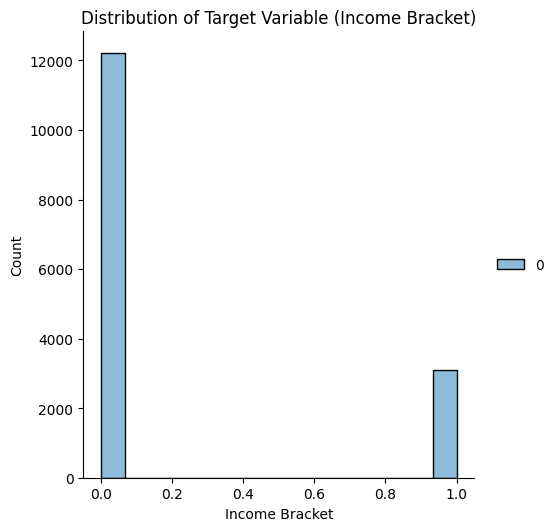

In [51]:
# distribution plot of the outcome variable
sns.displot(y)    # notice the default is a histogram
plt.title("Distribution of Target Variable (Income Bracket)")
plt.xlabel('Income Bracket')
plt.ylabel('Count')
plt.show()

## 4. Policy Simulation

### Interpretable Machine Learning

Use tools like coefficient plots or feature importance plots to investigate your models. Which features contribute to your predictions? Are there any additional features you wish you could incorporate that you don't have available in this analysis?

**Hint**: Use tools like feature importance plots and coefficient plots.

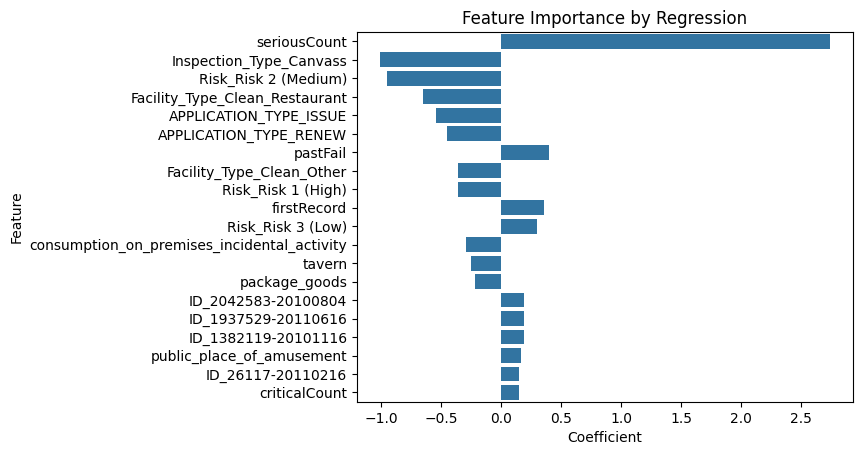

In [52]:
# extract the coefficents and create a dataframe for plotting 
logit_data = pd.concat([pd.DataFrame(X.columns),
                        pd.DataFrame(np.transpose(best_logit_model.coef_))],
                       axis = 1)

logit_data.columns = ['Feature', 'Coefficient']
logit_data['abs_coef'] = abs(logit_data['Coefficient'])

# plot 
sns.barplot(x="Coefficient", 
            y="Feature", 
            data=logit_data.nlargest(20, 'abs_coef')).set_title("Top Logit Coefficients")
plt.title('Feature Importance by Regression')
plt.show()

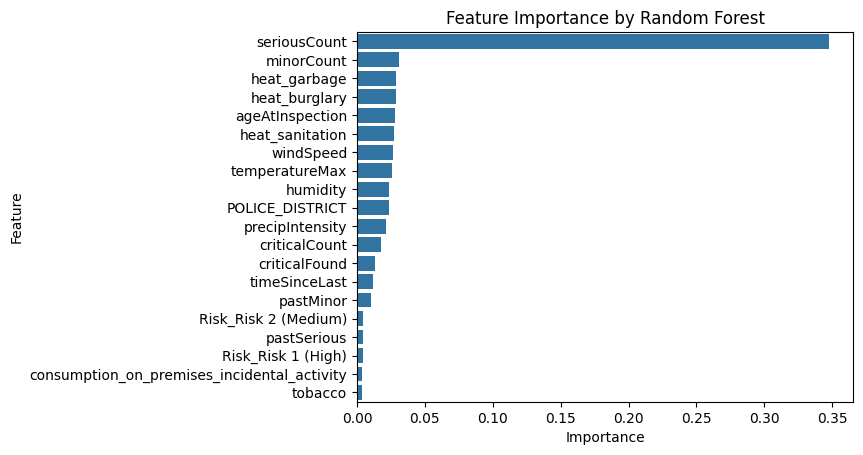

In [53]:
# import library
import seaborn as sns

# create feature importance dataframe
feat_importances = pd.concat([pd.DataFrame(X.columns),pd.DataFrame(np.transpose(rf_classifier.feature_importances_))], axis = 1)
feat_importances.columns = ["Feature", "Importance"]

# plot 
sns.barplot(x = "Importance", 
            y = "Feature", 
            data = feat_importances.nlargest(20, 'Importance')) # identify the 10 most important features
plt.title('Feature Importance by Random Forest')
plt.show()

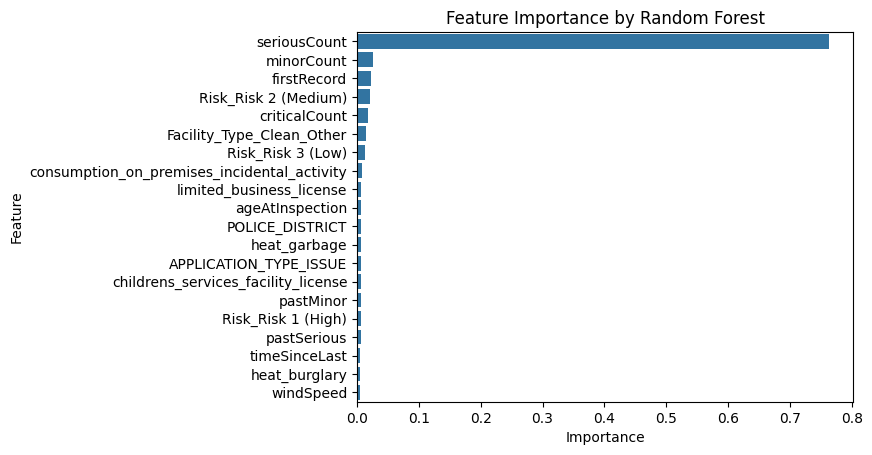

In [55]:
# create feature importance dataframe
feat_importances = pd.concat([pd.DataFrame(X.columns),pd.DataFrame(np.transpose(xgb_classifier.feature_importances_))], axis = 1)
feat_importances.columns = ["Feature", "Importance"]

# plot 
sns.barplot(x = "Importance", 
            y = "Feature", 
            data = feat_importances.nlargest(20, 'Importance')) # identify the 10 most important features
plt.title('Feature Importance by Random Forest')
plt.show()

The feature importance plots show that all three of my models consistently rely on the same core predictors when determining whether an establishment is likely to fail an inspection. In particular, seriousCount stands out as the dominant feature—especially in the XG Boost model, where it contributes far more than any other variable. This aligns with expectations: establishments with repeated serious violations tend to have deeper, unresolved food safety issues, so the model naturally places heavy weight on this history. Other violation-related variables such as minorCount, criticalCount, and past risk classifications also contribute, though their importance is much lower. These patterns suggest that the models mostly depend on an establishment’s compliance trajectory rather than broader contextual factors.

The plot makes this clear: the bar for seriousCount is substantially larger than all others, indicating that the model is essentially using severity and frequency of past problems as the main signal for future failure. Operational attributes (such as facility type or license category) appear, but with relatively small influence, which means they provide additional nuance but do not drive predictions on their own.

There are, however, several features that would strengthen the analysis if they were available. For example, information on the type of food served or specific products handled could help differentiate inherently higher-risk establishments—such as raw seafood vendors or places handling dairy—where biological hazards are more likely. Similarly, factors related to food preparation methods, kitchen infrastructure, or temperature-control practices would provide insight into operational risks that historical counts alone cannot capture. Adding these would improve the model’s ability to identify emerging risks rather than relying almost entirely on past violations.

### Prioritize Audits

**Hint**: Look up the [`.predict()`](https://www.kite.com/python/docs/sklearn.linear_model.SGDRegressor.predict), [`.predict_proba()`](https://www.kite.com/python/docs/sklearn.linear_model.LogisticRegression.predict_proba), and [`.sample()`](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.sample.html) methods. Then: 
1. Choose one of your models (or train a new simplified model or ensemble!) to predict outcomes and probabilities. 
2. Order your audits by their probability of detecting a "Fail" score
3. Plot your distribution of pass/fail among the first 1,000 observations in the dataset
4. Simulate random audits on the full chicago_2011_to_2013.csv dataset by picking 1,000 observations at random

In [65]:
id_cols = [col for col in X.columns if col.startswith("ID_")]
row_ids = X[id_cols].idxmax(axis=1)
row_ids_clean = row_ids.str.replace("ID_", "", regex=False)


In [81]:

actual_results = chicago_inspections_2011_to_2013Original["Results"].values
actual_results.shape

(17677,)

In [83]:
#
# 1. Choose one of your models (or train a new simplified model or ensemble!) to predict outcomes and probabilities.
# I am going to use XG Boost

# Make predictions on the test set
y_pred = best_xgb_model.predict(X)

#est_ids = chicago_inspections_2011_to_2013Original["ID"].values
#est_names = chicago_inspections_2011_to_2013Original["DBA_Name"]
fail_probs = best_xgb_model.predict_proba(X)[:, 1] #column 1 is probability of FAIL


results = pd.DataFrame({
    "Establishment_ID": row_ids_clean,
    "Fail_Probability": fail_probs,
    "Predicted_Class": y_pred
})
results


,,Establishment_ID,Fail_Probability,Predicted_Class
Inspection_ID,DBA_Name,,,
269961,SEVEN STAR,30790-20110416,0.038699,0
507211,PANERA BREAD,1475890-20110416,0.036621,0
507212,LITTLE QUIAPO RESTAURANT,1740130-20110216,0.674719,1
507216,SERGIO'S TAQUERIA PIZZA INC.,1447363-20110216,0.036621,0
507219,TARGET STORE # T-2079,1679459-20100216,0.590463,1
...,...,...,...,...
1393258,CIAO BELLA CAFE,2232690-20130327,0.036975,0
1395218,Christian Fields Style Bar,2002599-20130716,0.036828,0
1395224,W CHICAGO - LAKESHORE,2189458-20130213,0.749230,1


In [92]:
#
# 2. Order your audits by their probability of detecting a "Fail" score
# 3. Plot your distribution of pass/fail among the first 1,000 observations in the dataset
# -----------

df_sorted = results.sort_values("Fail_Probability", ascending=False)
top_1000 = df_sorted.head(1000)
top_1000

,,Establishment_ID,Fail_Probability,Predicted_Class
Inspection_ID,DBA_Name,,,
1174318,LA GARITA DE SAN LUIS,1476934-20100816,0.814470,1
1158413,CITGO FUEL & MINI MART,1579507-20110716,0.803637,1
1170410,FAT DADDY STORE,1848268-20120816,0.803637,1
547860,SKY FOOD AND DOLLAR,1770077-20100816,0.803637,1
1369913,Quick Stop Gas & Mini Mart,1043848-20121016,0.803637,1
...,...,...,...,...
1106648,"CLARK STREET PANCAKE HOUSE, INC.",2185197-20121108,0.697415,1
1198926,JADE EAST RESTAURANT,66572-20130416,0.697103,1
1106930,CHICAGO JOE'S,12380-20121216,0.697103,1


In [93]:
top_1000 = top_1000.merge(
    chicago_inspections_2011_to_2013Original[["ID", "Results"]],
    left_on="Establishment_ID",
    right_on="ID",
    how="left"
)
top_1000 = top_1000.drop(columns=["ID"])
top_1000.head(10)

,Establishment_ID,Fail_Probability,Predicted_Class,Results
0,1476934-20100816,0.814470,1,Fail
1,1579507-20110716,0.803637,1,Fail
2,1848268-20120816,0.803637,1,Fail
3,1770077-20100816,0.803637,1,Fail
4,1043848-20121016,0.803637,1,Fail
5,1476109-20110416,0.803637,1,Fail
6,1844157-20120616,0.803637,1,Fail
7,1742544-20110516,0.803637,1,Fail
8,39494-20101116,0.803637,1,Fail
9,26177-20120116,0.802870,1,Fail


In [71]:
#
# 4. Simulate random audits on the full chicago_2011_to_2013.csv dataset by picking 1,000 observations at random
# -----------
random_1000 = chicago_inspections_2011_to_2013.sample(1000, random_state=42)
random_1000.head(1000)

,,Facility_Type,Risk,Inspection_Type,Results,Facility_Type_Clean,criticalCount,seriousCount,minorCount,pastFail,pastCritical,pastSerious,pastMinor,timeSinceLast,firstRecord,ID,WARD_PRECINCT,POLICE_DISTRICT,LICENSE_DESCRIPTION,APPLICATION_TYPE,ageAtInspection,consumption_on_premises_incidental_activity,tobacco,package_goods,outdoor_patio,public_place_of_amusement,limited_business_license,childrens_services_facility_license,tavern,regulated_business_license,filling_station,caterers_liquor_license,mobile_food_license,precipIntensity,temperatureMax,windSpeed,humidity,heat_burglary,heat_garbage,heat_sanitation,criticalFound
Inspection_ID,DBA_Name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1277334,Aquarius Club & Restaurant,Restaurant,Risk 1 (High),Canvass,Pass,Restaurant,0,0,4,0,0,0,0,2.000000,1,1477528-20110116,31-4,25.0,Retail Food Establishment,RENEW,8.123288,1,1,0,0,0,0,0,0,0,0,0,0,0.017333,85.460000,9.113333,0.553333,20.376028,18.461970,33.690196,0
670538,SUBWAY 3634,Restaurant,Risk 1 (High),Canvass,Fail,Restaurant,1,1,4,0,0,0,0,2.000000,1,1719200-20100416,49-17,24.0,Retail Food Establishment,RENEW,5.558904,0,0,0,0,0,0,0,0,0,0,0,0,0.001813,37.966667,10.010000,0.733333,6.103809,10.314125,11.596479,1
598531,"MANGIA FRESCA INC.,",Restaurant,Risk 1 (High),Canvass,Pass,Restaurant,0,0,4,0,0,0,0,2.000000,1,1942409-20111216,11-1,9.0,Retail Food Establishment,RENEW,3.024658,0,0,0,0,0,0,0,0,0,0,0,0,0.000330,37.680000,9.140000,0.743333,10.073717,5.395386,4.106813,0
1184324,PADDY O FEGAN'S,Restaurant,Risk 1 (High),Canvass,Pass,Restaurant,0,0,3,0,0,0,0,2.000000,1,1904207-20110720,27-1,12.0,Retail Food Establishment,ISSUE,0.827397,0,0,0,0,0,0,0,0,0,0,0,0,0.000383,74.166667,10.043333,0.406667,15.924885,4.341055,7.117970,0
1376178,YOLK CAFE,Restaurant,Risk 1 (High),Canvass,Pass w/ Conditions,Restaurant,1,1,1,0,0,0,1,1.671233,0,2049342-20120816,42-41,18.0,Retail Food Establishment,RENEW,3.380822,0,0,0,0,0,0,0,0,0,0,0,0,0.000400,23.563333,11.176667,0.730000,6.833245,0.000080,9.520084,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1353567,EL CID TACOS #2,Restaurant,Risk 1 (High),Canvass,Pass w/ Conditions,Restaurant,0,1,6,0,0,0,3,0.682192,0,1948872-20111116,32-7,14.0,Retail Food Establishment,RENEW,4.230137,1,0,0,1,0,0,0,0,0,0,0,0,0.004313,83.940000,8.903333,0.700000,39.974764,16.857611,51.123594,0
1150541,ALDEN NURSING CENTER WENTWORTH,Long Term Care,Risk 1 (High),Canvass,Pass,Other,0,0,3,0,0,0,2,0.783562,0,23447-20101016,6-4,7.0,Long-Term Care Facility,RENEW,9.676712,0,0,0,0,0,0,0,0,1,0,0,0,0.000000,93.283333,8.926667,0.540000,18.060858,11.511427,13.917990,0
1138306,BAISI THAI,Restaurant,Risk 1 (High),Canvass,Pass,Restaurant,0,0,8,0,0,0,0,2.000000,1,1043118-20110316,42-61,18.0,Retail Food Establishment,RENEW,10.043836,1,0,0,0,0,0,0,0,0,0,0,0,0.000090,88.443333,12.930000,0.473333,21.325372,1.779204,3.932381,0


In [105]:
top_1000["Actual_Fail"]    = (top_1000["Results"]    == "Fail").astype(int)
top_correct = (top_1000["Predicted_Class"] == top_1000["Actual_Fail"]).mean()
num_fail = (random_1000["Results"] == "Fail").sum()

print("Correctly failed by random selecting 1000:", (num_fail/1000)*100,"%")
print("Correctly failed predicted", round(top_correct * 100, 2), "%")


Correctly failed by random selecting 1000: 20.3 %
Correctly failed predicted 75.09 %


Using recall as the priority metric, random auditing performs significantly worse than predictive auditing. When selecting 1,000 inspections at random, only about 20% of them were establishments that actually failed. This means that random auditing captures only a small share of risky establishments, leaving most failures undetected.

In contrast, predictive auditing—ranking establishments by their estimated probability of failure and then selecting the top 1,000—correctly identified about 75% of the true failures. Even though I did not compute a formal recall score here, the comparison is direct because in both cases I know the ground-truth outcomes of the selected inspections. This large gap shows that predictive auditing is far more effective at prioritizing high-risk establishments.

### Predict on 2014 inspection data

Use your favorite model to make predictions based on the features using the "Chicago Inspection 2014_updated.csv" file. Treat this as you would a test dataset. This means you will have to format the features (including removing some features and getting dummies) and the label (binarize and recode) in the same way you did the training data. (Remember the "Results" column is your label). You will then compare your predictions with the actual.

In [73]:
# data processing
df14 = chicago_inspections_2014.copy()

# process features
cols_to_drop = [
    'AKA_Name', 'License', 'Address', 'City', 'State', 'Zip',
    'Latitude', 'Longitude', 'Location',
    'LICENSE_ID', 'LICENSE_TERM_START_DATE', 'LICENSE_TERM_EXPIRATION_DATE',
    'LICENSE_STATUS', 'ACCOUNT_NUMBER', 'LEGAL_NAME',
    'DOING_BUSINESS_AS_NAME', 'ADDRESS', 'CITY', 'STATE', 'ZIP_CODE',
    'WARD', 'PRECINCT', 'LICENSE_CODE', 'BUSINESS_ACTIVITY_ID',
    'BUSINESS_ACTIVITY', 'LICENSE_NUMBER',
    'LATITUDE', 'LONGITUDE',
    'pass_flag', 'fail_flag',
    'Inspection_Date', 'minDate', 'maxDate', 'Inspection_MonthYear'
]

df14 = df14.drop(columns=cols_to_drop, errors="ignore")

# --- 3. Drop rows with missing values (same idea as train) ---
df14 = df14.dropna()

# process target 
y_2014 = df14['Results'].replace({'Pass w/ Conditions': 'Pass'})
# Fail = 1, Pass = 0
y_2014 = (y_2014 == 'Fail').astype(int)

# --- 5. Build feature matrix X_2014 (drop target + some high-cardinality columns) ---
X_2014 = df14.drop(columns=['Results', 'ID', 'Facility_Type', 'LICENSE_DESCRIPTION', 'WARD_PRECINCT'],
                   errors='ignore')

# One-hot encode
X_2014 = pd.get_dummies(X_2014)

# --- 6. Align columns with training X (very important!) ---
X_2014 = X_2014.reindex(columns=X.columns, fill_value=0)
y_2014.head()

1    0
2    0
3    1
4    1
5    1
Name: Results, dtype: int64

In [75]:
# predict and compare 
y_2014_pred = best_xgb_model.predict(X_2014)
y_2014_proba = best_xgb_model.predict_proba(X_2014)[:, 1]

In [76]:
# evaluate
print("2014 Accuracy:", accuracy_score(y_2014, y_2014_pred))
print("2014 Recall:", recall_score(y_2014, y_2014_pred))


2014 Accuracy: 0.8963677927355854
2014 Recall: 0.9285714285714286


The accuracy indicates that the model performs well overall, but it is the recall score that matters more for decision-makers. A recall of roughly 93% means the model successfully identifies most of the establishments that actually fail, which aligns with the goal of focusing inspections on the highest-risk cases.

I selected XGBoost because it consistently showed the strongest recall during model development and tends to handle imbalanced classification problems more effectively than simpler models like logistic regression. Its ability to capture nonlinear relationships also helps reduce underfitting, which is important in a dataset where risky establishments may be a small but heterogeneous group.

Overall, the model performs well on out-of-sample 2014 data and supports a policy strategy that prioritizes safely identifying as many failure-risk establishments as possible.

## 5. Discussion Questions

1. Why do we need metrics beyond accuracy when using machine learning in the social sciences and public policy?


Accuracy alone is often misleading in social science and public policy applications because the underlying datasets are rarely balanced. Many of the outcomes we care about—such as fraud, credit default, homelessness episodes, or health-inspection failures—are rare events. An algorithm can achieve very high accuracy simply by predicting the majority class every time, while completely failing to identify the rare but policy-critical cases. In these settings, metrics such as precision, recall, and the F1 score provide much more meaningful information about how a model handles the outcomes we care most about.

In my case, the goal is to identify establishments likely to fail a food-safety inspection. Because failures are relatively rare, accuracy by itself would overstate model performance. This is why I prioritize recall, which captures the proportion of actual failures the model successfully identifies. From a policy perspective, minimizing false negatives—cases where a high-risk establishment is predicted to pass—is essential. Missing these cases poses the highest public-health risk, since these establishments would continue operating without necessary interventions. For this reason, metrics beyond accuracy are indispensable when evaluating models that inform real-world policy decisions.

2. Imagine that establishments learned about the algorithm being used to determine who gets audited and they started adjusting their behavior (and changing certain key features about themselves that were important for the prediction) to avoid detection. How could policymakers address this interplay between algorithmic decisionmaking and real world behavior?

If establishments began adjusting their behavior to exploit the algorithm, it would create a cat-and-mouse dynamic in which predictions steadily lose accuracy as businesses learn which features to manipulate. Policymakers can respond by regularly updating and retraining the model so that establishments cannot rely on a fixed set of predictors, and by maintaining a mix of algorithmic and random audits to prevent full predictability. They can also broaden or rotate the features used in the model, reducing dependence on a small set of easily influenced variables and incorporating harder-to-game indicators. Together, these strategies help preserve the model’s integrity and ensure that inspections continue to reflect true underlying risk rather than strategic behavior.